### Problem: Multi-class Dog Breed Identification
### Evaluated On: Multi Class Log Loss
### This is built using TensorFlow and TensorFlow Hub.

### ONE TIME-Create Helpers Jupiter Notebook and convert it to Python Extension for easy Import

In [2]:
!jupyter nbconvert --to script "/content/drive/My Drive/Dog Breed Identification/utility/helpers.ipynb"
!mv "/content/drive/My Drive/Dog Breed Identification/utility/helpers.txt" \
     "/content/drive/My Drive/Dog Breed Identification/utility/helpers.py"

[NbConvertApp] WARNING | pattern '/content/drive/My Drive/Dog Breed Identification/utility/helpers.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equiva

### ONE TIME-Create optional Init file since Python

In [3]:
with open("/content/drive/My Drive/Dog Breed Identification/utility/__init__.py", "w") as f:
    f.write("# Makes this folder a package")


### Import Packages

In [4]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import os
from IPython.display import Image
import numpy as np
from sklearn.model_selection import train_test_split
import tf_keras as tfk
import datetime
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

import sys
sys.path.append("/content/drive/My Drive/Dog Breed Identification/utility")
#from helpers import check_gpu
import helpers as hlp

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Mount Drive
### Set Path containing Utility functions
### Check for GPU Availability

In [5]:
hlp.check_gpu()

GPU available (YES!!!!)


### Unzip Data files provided located in Google Drive

In [6]:
#!unzip "drive/MyDrive/Dog Breed Identification/dog-breed-identification-data.zip" -d "drive/MyDrive/Dog Breed Identification/"

### Get Data Ready by turning into Tensors


### Get images and their labels

In [7]:
labels_csv = pd.read_csv("drive/MyDrive/Dog Breed Identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


### Prepare Data

In [8]:
# Get image names and set Path Name.
filenames = ["drive/MyDrive/Dog Breed Identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

In [9]:
# Get Labels
breed_labels = labels_csv["breed"].to_numpy()

### Validate Data

In [10]:
# Validate filenames with images provided
if len(os.listdir("drive/MyDrive/Dog Breed Identification/train/")) == len(filenames):
  print("All images are available")
else:
  print("Not all images are available")

All images are available


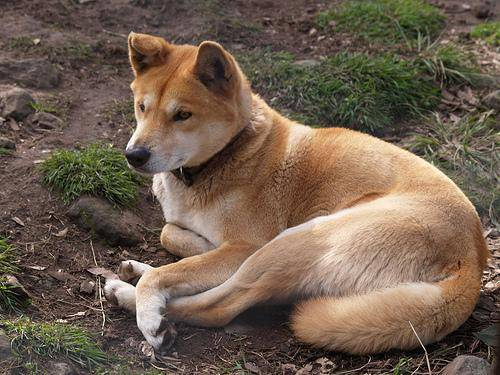

In [11]:
# Check data
Image(filenames[4000])

In [12]:
# Validate Breed Labels with File names
if len(breed_labels) == len(filenames):
  print("All labels are available")
else:
  print("Not all labels are available")

All labels are available


In [13]:
# Find Unique Labels
unique_breeds = np.unique(breed_labels)

### Convert Labels to boolean

In [14]:
boolean_labels = [label == unique_breeds for label in breed_labels]

### Due to large test dataset, take a subset of training data and create Test and Validation set for trial.

In [15]:
X = filenames
y = boolean_labels

In [16]:
NUM_IMAGES = 1000 #@param {type : "slider", min:1000, max:10000, step:10}


In [17]:
# Split 80% of data for training and 20% for validation set
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

### Create Training and Validation data into Batches

In [18]:
train_data_batches = hlp.create_data_batches(X_train, y_train)
validation_data_batches = hlp.create_data_batches(X_val, y_val,validation_data=True)

Creating training data batches...
Creating validation data batches...


### Load Pretrained model build for our requirements

In [19]:
# INPUT_SHAPE = [batch, height, width, color channels]
# Set Image Size
IMG_SIZE = 224
COLOR_CHANNELS = 3
INPUT_SHAPE= [None, IMG_SIZE, IMG_SIZE, COLOR_CHANNELS]
# OUTPUT_SHAPE OF MODEL
OUTPUT_SHAPE = len(unique_breeds)
# MODEL URL
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

In [20]:
model = hlp.create_model(INPUT_SHAPE,OUTPUT_SHAPE,MODEL_URL)
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [21]:
#from tensorflow.keras.utils import plot_model
#plot_model(model, show_shapes=True, show_layer_names=True)

In [22]:
# Set Callback parameters
early_stopping = tfk.callbacks.EarlyStopping(monitor="val_accuracy",
                                             patience=3)
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

### Train Model

In [23]:
model = hlp.train_model(train_data_batches,NUM_EPOCHS, validation_data_batches,early_stopping)

Training model...
Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 191s 7s/step - loss: 4.5121 - accuracy: 0.0962 - val_loss: 3.4221 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 151ms/step - loss: 1.6174 - accuracy: 0.6837 - val_loss: 2.1818 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 4s 152ms/step - loss: 0.5680 - accuracy: 0.9350 - val_loss: 1.7041 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 5s 211ms/step - loss: 0.2531 - accuracy: 0.9887 - val_loss: 1.5128 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 3s 125ms/step - loss: 0.1494 - accuracy: 0.9962 - val_loss: 1.4405 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 5s 194ms/step - loss: 0.1016 - accuracy: 0.9987 - val_loss: 1.3949 - val_accuracy: 0.6500
Epoch 7/100
25/25

In [24]:
## TensorBoard Callback
%load_ext tensorboard
### Checking the TensorBoard logs
%tensorboard --logdir drive/MyDrive/Dog\ Breed\ Identification/logs

Output hidden; open in https://colab.research.google.com to view.

### Make Predictions on the Validation Data

In [25]:
predictions = model.predict(validation_data_batches, verbose=1)
len(predictions)

7/7 [==============================] - 1s 87ms/step


200

In [26]:
validation_images, validation_labels = hlp.unbatchify(unique_breeds,validation_data_batches)

In [27]:
#validation_images[0], validation_labels[0]

### Function plotting prediction Probability, Label and Image

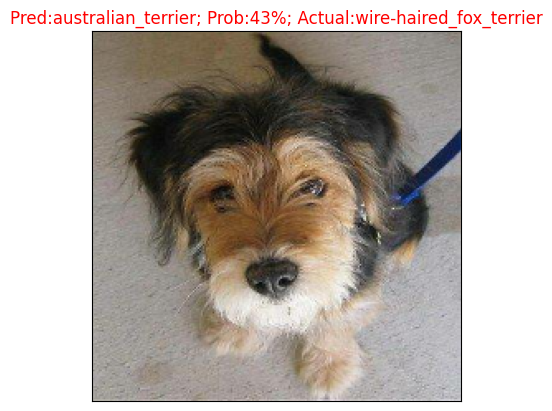

In [28]:
hlp.plot_pred(unique_breeds, prediction_probabilities=predictions,
          labels=validation_labels,
          images=validation_images,
          n=102)

### Function to view top 10 predictions

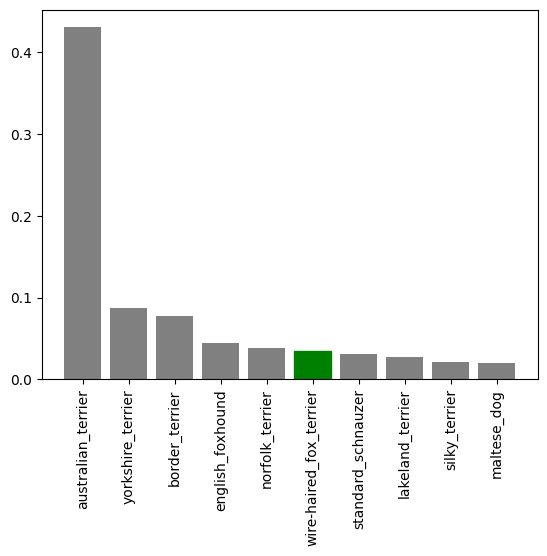

In [29]:
hlp.plot_pred_conf(unique_breeds,prediction_probabilities=predictions,labels=validation_labels,n=102)

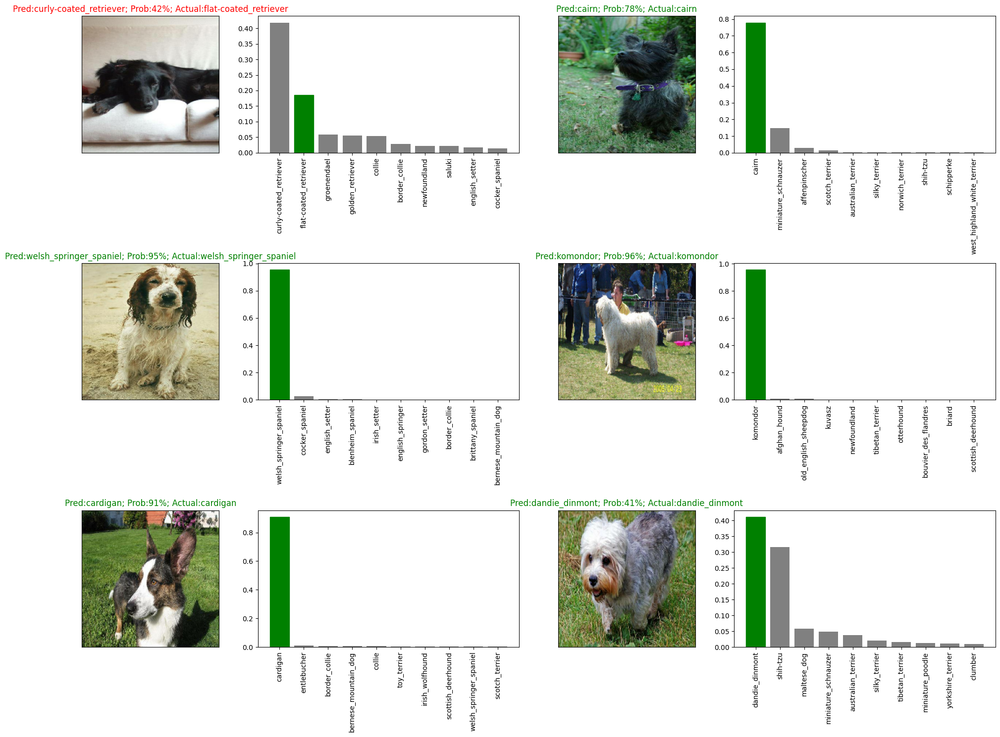

In [30]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows =3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  hlp.plot_pred(unique_breeds,
      prediction_probabilities=predictions,
            labels=validation_labels,
            images=validation_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  hlp.plot_pred_conf(unique_breeds,
      prediction_probabilities=predictions,
                 labels=validation_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
  i_multiplier += len(validation_labels) // len(unique_breeds)
plt.show()


### Save Model

In [31]:
# Save our model
MODEL_DIR_PATH = "drive/MyDrive/Dog Breed Identification/models"
hlp.save_model(MODEL_DIR_PATH,model, suffix="mobilenetv2-1000-images-Adam")

Saving model to: drive/MyDrive/Dog Breed Identification/models/20250503-215103-mobilenetv2-1000-images-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Breed Identification/models/20250503-215103-mobilenetv2-1000-images-Adam.h5'

### Load Model

In [32]:
loaded_1000_image_model = hlp.load_model('drive/MyDrive/Dog Breed Identification/models/20250503-204236-mobilenetv2-1000-images-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Breed Identification/models/20250503-204236-mobilenetv2-1000-images-Adam.h5


### Evaluate the pre-saved model

In [33]:
model.evaluate(validation_data_batches)

7/7 [==============================] - 1s 110ms/step - loss: 1.2730 - accuracy: 0.6650


[1.2729610204696655, 0.6650000214576721]

In [34]:
loaded_1000_image_model.evaluate(validation_data_batches)

7/7 [==============================] - 1s 89ms/step - loss: 1.3227 - accuracy: 0.6850


[1.3226786851882935, 0.6850000023841858]

### Training a big dog model on the full data

In [35]:
# Create a data batch with full data set
full_data_batches = hlp.create_data_batches(X,y)

Creating training data batches...


In [36]:
# No validation set when training on all the data
full_model_early_stopping = tfk.callbacks.EarlyStopping(monitor="accuracy",
                                                      patience=3)
full_model = hlp.train_full_model(full_data_batches,NUM_EPOCHS,full_model_early_stopping)

Training Full model...
Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
320/320 [==============================] - 42s 114ms/step - loss: 1.3267 - accuracy: 0.6743
Epoch 2/100
320/320 [==============================] - 37s 116ms/step - loss: 0.4003 - accuracy: 0.8806
Epoch 3/100
320/320 [==============================] - 37s 116ms/step - loss: 0.2358 - accuracy: 0.9354
Epoch 4/100
320/320 [==============================] - 37s 116ms/step - loss: 0.1533 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 38s 117ms/step - loss: 0.1060 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0787 - accuracy: 0.9857
Epoch 7/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0592 - accuracy: 0.9908
Epoch 8/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0446 - accuracy: 0.9944
Epoch 9/100
320/320 [================

### Save Full Model

In [37]:
# Save our model
MODEL_DIR_PATH = "drive/MyDrive/Dog Breed Identification/models"
hlp.save_model(MODEL_DIR_PATH,full_model, suffix="mobilenetv2-full-images-Adam")

Saving model to: drive/MyDrive/Dog Breed Identification/models/20250503-220026-mobilenetv2-full-images-Adam.h5...


'drive/MyDrive/Dog Breed Identification/models/20250503-220026-mobilenetv2-full-images-Adam.h5'

### Load the full model


In [39]:
loaded_full_image_model = hlp.load_model('drive/MyDrive/Dog Breed Identification/models/20250503-220026-mobilenetv2-full-images-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Breed Identification/models/20250503-220026-mobilenetv2-full-images-Adam.h5


### Make Predictions on Test Data Set

In [40]:
# 1 Get the test image file names
# 2 Convert the filnames into test data batches using create_data_batches
# 3 Make a predictions array by passing the test batches to the predict() method called on our model

# Load test image file names
test_path = "drive/MyDrive/Dog Breed Identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [41]:
test_filenames[:10]

['drive/MyDrive/Dog Breed Identification/test/e9574ebd4785c1e1a1470dfc93f9271e.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e806fbb5ca4dd3a094f7819bd810cc65.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e29f03a924c493b29d17877204dd0205.jpg',
 'drive/MyDrive/Dog Breed Identification/test/dc78472e337f612c787c9fb524ff9f48.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e1a777d181483b0982732fa4128df7f8.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e443bb594a89ab5fa1266748d6b41648.jpg',
 'drive/MyDrive/Dog Breed Identification/test/df47feaaf3dfb33cf712cccdddc8060e.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e5ded7a736b3336729463af8d74a09c9.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e487437a727b3e4f0b919c878d39ae6e.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e2a9a7580a1424bc6531b2b7375338db.jpg']

### Create Test Data Batches

In [42]:
# Create test data batch
test_data = hlp.create_data_batches(test_filenames, test_data=True)

Creating test data batches...


### Make predictions on test data batch using the loaded full model

In [43]:
test_predictions = loaded_full_image_model.predict(test_data,
                                                    verbose=1)

324/324 [==============================] - 222s 662ms/step


# Save predictions (NumPy array) to CSV to access later

In [44]:
np.savetxt("drive/MyDrive/Dog Breed Identification/test_predictions_array.csv", test_predictions, delimiter=",")

### Load predictions (NumPy array) from csv file

In [56]:

test_predictions = np.loadtxt("drive/MyDrive/Dog Breed Identification/test_predictions_array.csv", delimiter=",")

In [57]:
test_predictions.shape

(10357, 120)

### Preparing test data set predictions as per requirements

In [58]:
# Create ID column and a column for each dog breed

# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["Id"] + list(unique_breeds))
preds_df

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [59]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["Id"] = test_ids
preds_df.head()

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e9574ebd4785c1e1a1470dfc93f9271e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e806fbb5ca4dd3a094f7819bd810cc65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e29f03a924c493b29d17877204dd0205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,dc78472e337f612c787c9fb524ff9f48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1a777d181483b0982732fa4128df7f8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [60]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e9574ebd4785c1e1a1470dfc93f9271e,4.347610e-06,4.404179e-05,1.619367e-08,3.791306e-07,3.626068e-06,6.449303e-09,2.872685e-08,8.475772e-06,3.680020e-08,...,3.777884e-02,1.898466e-05,7.232585e-08,1.017013e-06,2.036491e-06,1.507199e-07,2.501790e-03,5.705873e-08,1.825340e-03,1.295094e-05
1,e806fbb5ca4dd3a094f7819bd810cc65,1.358470e-07,6.557967e-09,1.894265e-09,6.660465e-05,6.753568e-09,6.779239e-09,6.253967e-06,1.898139e-08,2.618333e-10,...,2.265523e-08,2.329138e-08,8.198691e-08,2.201284e-08,1.847214e-09,5.927312e-08,1.878471e-08,3.304071e-08,9.955006e-01,5.931372e-06
2,e29f03a924c493b29d17877204dd0205,8.424605e-08,1.578213e-04,2.042186e-09,2.333168e-11,1.116913e-09,2.330694e-12,5.039534e-11,1.127292e-11,1.151684e-09,...,2.248571e-06,5.158794e-12,2.222088e-10,3.122216e-10,2.127349e-09,3.523157e-11,2.718955e-08,4.833818e-10,1.970874e-06,4.285469e-07
3,dc78472e337f612c787c9fb524ff9f48,1.201640e-10,5.969677e-08,6.166351e-10,6.328875e-12,6.798384e-07,7.852993e-09,5.296798e-11,9.381877e-09,6.957711e-09,...,1.016756e-10,5.954610e-08,3.466140e-11,5.956348e-08,2.235023e-09,2.885306e-11,8.820508e-08,8.158519e-09,1.481720e-11,1.458112e-10
4,e1a777d181483b0982732fa4128df7f8,6.168695e-10,1.753908e-10,3.244699e-08,2.216625e-08,7.264220e-07,2.342427e-10,6.299461e-05,1.237628e-07,1.731741e-08,...,1.630788e-07,3.980088e-07,1.784343e-07,1.402997e-09,3.068198e-10,3.678422e-09,1.821003e-07,1.835650e-08,7.169696e-07,4.285745e-06


In [61]:
# Export to CSV
preds_df.to_csv("drive/MyDrive/Dog Breed Identification/full_model_predictions_submissions_1.csv", index=False)

### Make Predictions using Custom Images

In [73]:
# 1. Get filepaths of our own images.
# 2. Turn the filepaths into data batches and set it as Test
# 3. Pass the custom image data batch to predict method
# 4. Convert the prediction output probabilities to prediction labels
# 5. Compare the predicted labels to the custom images

import os
custom_path = "drive/MyDrive/Dog Breed Identification/custom/"
custom_images = [custom_path + fname for fname in os.listdir(custom_path)]
custom_images

['drive/MyDrive/Dog Breed Identification/custom/Irish_Setter.jpeg',
 'drive/MyDrive/Dog Breed Identification/custom/golden-retrievers.jpeg',
 'drive/MyDrive/Dog Breed Identification/custom/Vizsla.jpeg',
 'drive/MyDrive/Dog Breed Identification/custom/brittany-spaniel.jpeg']

In [74]:
# Turn custom images into data batches
custom_data = hlp.create_data_batches(custom_images, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [75]:
custom_preds = loaded_full_image_model.predict(custom_data)
custom_preds.shape

1/1 [==============================] - 2s 2s/step


(4, 120)

In [78]:
# Get custom image prediction labels
custom_preds_labels = [hlp.get_prediction_label(unique_breeds,custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['irish_setter', 'golden_retriever', 'redbone', 'brittany_spaniel']

In [79]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


In [86]:
custom_images = np.array(custom_images)
custom_images.shape

(4, 224, 224, 3)

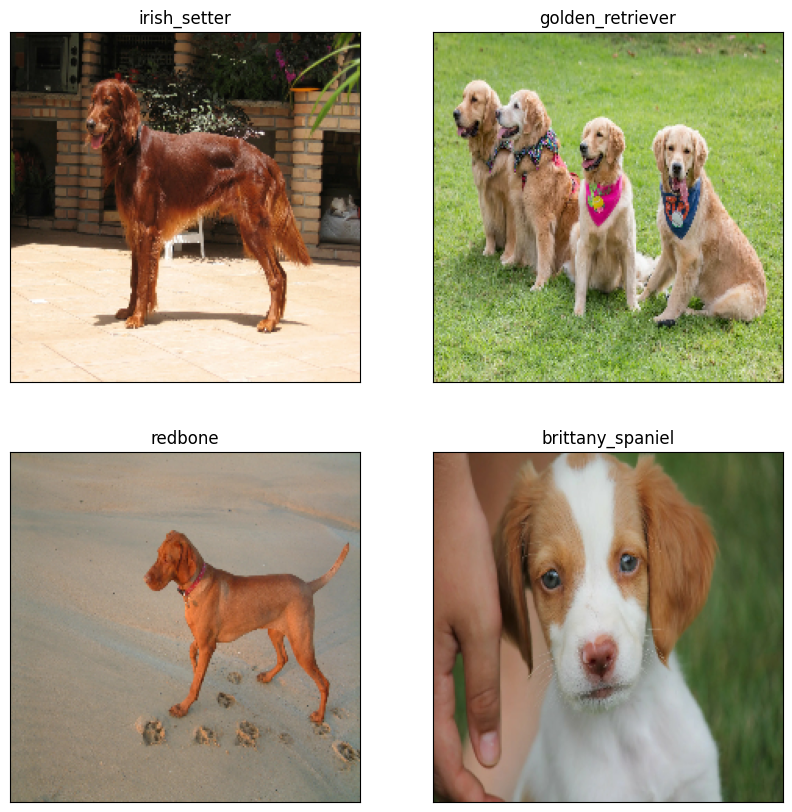

In [88]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(2, 2, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)
